[利用規約 | 政府統計の総合窓口](https://www.e-stat.go.jp/terms-of-use) に従い、データを利用します。

今回は、[小売物価統計調査 小売物価統計調査（動向編）主要品目の都市別小売価格－都道府県庁所在市及び人口15万以上の市(2000年1月～) | 統計表・グラフ表示 | 政府統計の総合窓口](https://www.e-stat.go.jp/dbview?sid=0003421913)のデータを加工して分析を行います。

出典：政府統計の総合窓口(e-Stat)（https://www.e-stat.go.jp/）

In [23]:
import warnings
warnings.filterwarnings("ignore")

In [24]:
import matplotlib.pyplot as plt
import japanize_matplotlib

from prophet import Prophet
import pandas as pd
from io import BytesIO

In [36]:
def forecast_and_plot_components_with_error_handling(data_path, city_names):
    # データの読み込み
    df = pd.read_csv(data_path, encoding="shift_jis")
    
    # 数値データの変換
    def _convert_to_float(x):
        try:
            return float(x.replace(",", ""))
        except:
            return None
    df["value"] = df["value"].apply(_convert_to_float)

    n_cities = len(city_names)
    n_rows = n_cities
    fig, axes = plt.subplots(n_rows, 2, figsize=(15, 5 * n_rows))  # 2列 (予測 + コンポーネント)

    not_error_city_names = []
    error_city_names = []

    for i, city_name in enumerate(city_names):
        try:
            # 指定された市区町村のデータを抽出
            df_city = df[df["地域"] == city_name].copy()

            # 型変換
            df_city["value"] = df_city["value"].astype(float)
            df_city = df_city.rename(columns={"時間軸（月）": "ds", "value": "y"})
            
            # 日付形式の変換
            df_city["ds"] = pd.to_datetime(df_city["ds"].apply(
                lambda x: x.replace("年", "-").replace("月", "-01") 
                if len(x) == 8
                else x.replace("年", "-0").replace("月", "-01")
            ))
            
            # Prophetモデルの作成と学習
            model = Prophet(
                seasonality_mode="multiplicative",
                yearly_seasonality=True,
                weekly_seasonality=False,
                daily_seasonality=False,
                mcmc_samples = 300,
            )
            model.fit(df_city,show_progress=False)

            # 予測
            future = model.make_future_dataframe(periods=300, freq='M')
            forecast = model.predict(future)

            # 左列: 予測プロット
            model.plot(forecast, ax=axes[i, 0])
            axes[i, 0].set_title(f'{city_name}の予測結果')

            # 右列: コンポーネントプロットを画像として描画
            fig_components = model.plot_components(forecast)
            buf = BytesIO()  # メモリ内に保存
            fig_components.savefig(buf, format='png')
            buf.seek(0)
            img = plt.imread(buf)
            axes[i, 1].imshow(img)
            axes[i, 1].axis('off')  # 軸を非表示にする

            # 不要なFigureを閉じる
            plt.close(fig_components)

        except Exception as e:
            # エラーをキャッチし、市名とエラー内容を表示
            print(f"市: {city_name} でエラーが発生しました: {e}")
            # 対応するプロットを空白に設定
            axes[i, 0].set_visible(False)
            axes[i, 1].set_visible(False)
            error_city_names.append(city_name)
        else:
            not_error_city_names.append(city_name)

    # 全体のレイアウトを調整
    plt.tight_layout()
    plt.show()

    return not_error_city_names, error_city_names

15:38:42 - cmdstanpy - INFO - CmdStan start processing
15:38:42 - cmdstanpy - INFO - Chain [1] start processing
15:38:42 - cmdstanpy - INFO - Chain [2] start processing
15:38:42 - cmdstanpy - INFO - Chain [3] start processing
15:38:42 - cmdstanpy - INFO - Chain [4] start processing
15:38:44 - cmdstanpy - INFO - Chain [3] done processing
15:38:44 - cmdstanpy - INFO - Chain [2] done processing
15:38:44 - cmdstanpy - INFO - Chain [1] done processing
15:38:44 - cmdstanpy - INFO - Chain [4] done processing
15:38:44 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exc

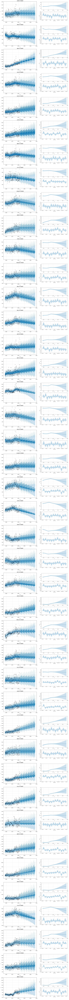

(['札幌市',
  '青森市',
  '盛岡市',
  '仙台市',
  '秋田市',
  '山形市',
  '福島市',
  '水戸市',
  '宇都宮市',
  '前橋市',
  '千葉市',
  '特別区部',
  '横浜市',
  '富山市',
  '金沢市',
  '福井市',
  '甲府市',
  '長野市',
  '岐阜市',
  '名古屋市',
  '津市',
  '大津市',
  '京都市',
  '大阪市',
  '神戸市',
  '奈良市',
  '和歌山市',
  '鳥取市',
  '松江市',
  '広島市',
  '山口市',
  '徳島市',
  '高松市',
  '松山市',
  '高知市',
  '福岡市',
  '佐賀市',
  '長崎市',
  '大分市',
  '宮崎市',
  '鹿児島市',
  '那覇市'],
 [])

In [37]:
data_path = "../datasets/FEH_00200571_241119204010.csv"

city_names = [
    '札幌市', '青森市', '盛岡市', '仙台市', '秋田市', '山形市', '福島市', '水戸市', '宇都宮市', '前橋市', 
    '千葉市', '特別区部', '横浜市', '富山市', '金沢市', '福井市', '甲府市', '長野市', '岐阜市', '名古屋市', 
    '津市', '大津市', '京都市', '大阪市', '神戸市', '奈良市', '和歌山市', '鳥取市', '松江市', '広島市', 
    '山口市', '徳島市', '高松市', '松山市', '高知市', '福岡市', '佐賀市', '長崎市', '大分市', '宮崎市',
    '鹿児島市', '那覇市'
]
forecast_and_plot_components_with_error_handling(data_path, city_names)
